In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from cuml.manifold import TSNE
import cudf
from sklearn.preprocessing import StandardScaler, MinMaxScaler

Index(['apogee_id', 'J', 'H', 'K', 'LOGG', 'M_H', 'VMICRO', 'VMACRO', 'C_FE',
       'CI_FE', 'N_FE', 'O_FE', 'NA_FE', 'MG_FE', 'AL_FE', 'SI_FE', 'S_FE',
       'K_FE', 'CA_FE', 'TI_FE', 'V_FE', 'CR_FE', 'MN_FE', 'NI_FE', 'FE_H',
       'class_spectral', 'class_lum_logg', 'class_lum_jhk',
       'class_lum_bins_logg', 'class_lum_bins_jhk'],
      dtype='object')

/home/maxime/miniforge3/envs/rapids-25.02/lib/python3.12/site-packages/cuml/internals/api_decorators.py:400: UserWarning: Starting from version 22.04, the default method of TSNE is 'fft'.
  return init_func(self, *args, **filtered_kwargs)


[2025-02-28 18:31:25.729] [CUML] [debug] Learning rate is adaptive. In TSNE paper, it has been shown that as n->inf, Barnes Hut works well if n_neighbors->30, learning_rate->20000, early_exaggeration->24.
[2025-02-28 18:31:25.730] [CUML] [debug] cuML uses an adpative method.n_neighbors decreases to 30 as n->inf. Likewise for the other params.
[2025-02-28 18:31:25.730] [CUML] [debug] New n_neighbors = 30, learning_rate = 151317.33333333334, exaggeration = 24.0
[2025-02-28 18:31:25.733] [CUML] [debug] Data size = (453952, 17) with dim = 2 perplexity = 70.000000
[2025-02-28 18:31:25.733] [CUML] [warning] Perplexity should be within ranges (5, 50). Your results might be a bit strange...
[2025-02-28 18:31:25.733] [CUML] [warning] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
[2025-02-28 18:31:25.735] [CUML] [debug] Getting distances.
[2025-02-28 18:31:43.312] [CUML] [debug] Now normalizing distances so exp(D) doesn't explode.
[2025-02-28 18

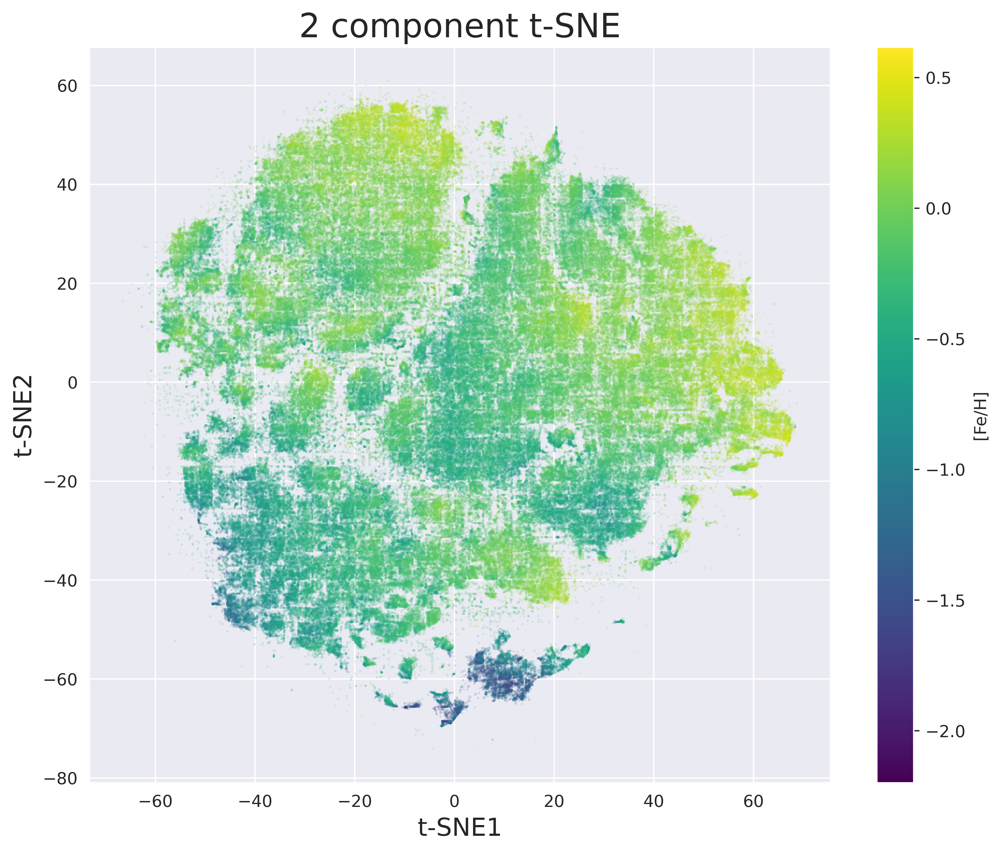

In [26]:



# data = pd.read_csv('../../../data/resample_normalized.csv')

data = pd.read_csv('../../../data/resample_normalized_flagged_v3.csv')

# drop collumn "STARFLAGS"
data = data.drop(columns=['STARFLAGS'])

display(data.columns)
data_id = data['apogee_id']

data_target = data[['class_spectral',
                    'class_lum_logg', 'class_lum_jhk', 'class_lum_bins_logg',
                    'class_lum_bins_jhk']]

# Suppression des colonnes non souhaitées
data = data.drop(columns=['M_H', 'VMICRO', 'VMACRO', 'J', 'H', 'K', 'LOGG',
                          'apogee_id', 'class_spectral',
                          'class_lum_logg', 'class_lum_jhk', 'class_lum_bins_logg',
                          'class_lum_bins_jhk'])

# apply standard scaler to data
scaler = StandardScaler()
#scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data)


data_cudf = cudf.DataFrame(data_scaled)

# Configuration de base de t-SNE (exemple avec 2 composantes)
tsne = TSNE(n_components=2, perplexity=70, random_state=42, verbose=True)
data_tsne = tsne.fit_transform(data_cudf)

# Affichage des résultats
data_tsne_pd = data_tsne.to_pandas()

import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,8), dpi=500)
ax = fig.add_subplot(1,1,1)


# Create the scatter plot with color gradient from FE_H
sc = ax.scatter(data_tsne_pd[0], data_tsne_pd[1], s=0.005, c=data['FE_H'], cmap='viridis')
ax.set_xlabel('t-SNE1', fontsize=15)
ax.set_ylabel('t-SNE2', fontsize=15)
ax.set_title('2 component t-SNE', fontsize=20)

# Add a color bar with label
plt.colorbar(sc, label='[Fe/H]')
plt.show()


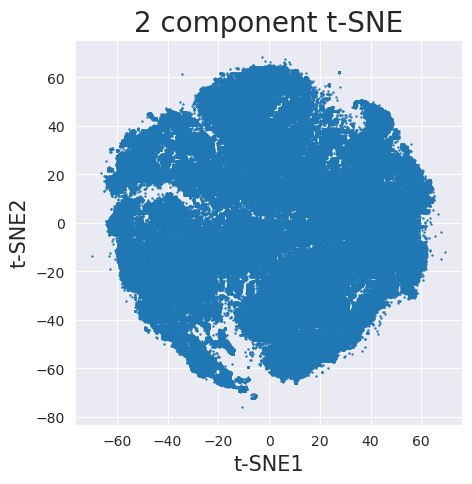

In [24]:
fig = plt.figure(figsize = (5,5))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('t-SNE1', fontsize = 15)
ax.set_ylabel('t-SNE2', fontsize = 15)
ax.set_title('2 component t-SNE', fontsize = 20)
plt.scatter(data_tsne_pd[0], data_tsne_pd[1], s=0.5)
plt.show()


In [4]:
# display collumns and name
display(data_tsne_pd.columns)

Index([0, 1], dtype='int64')

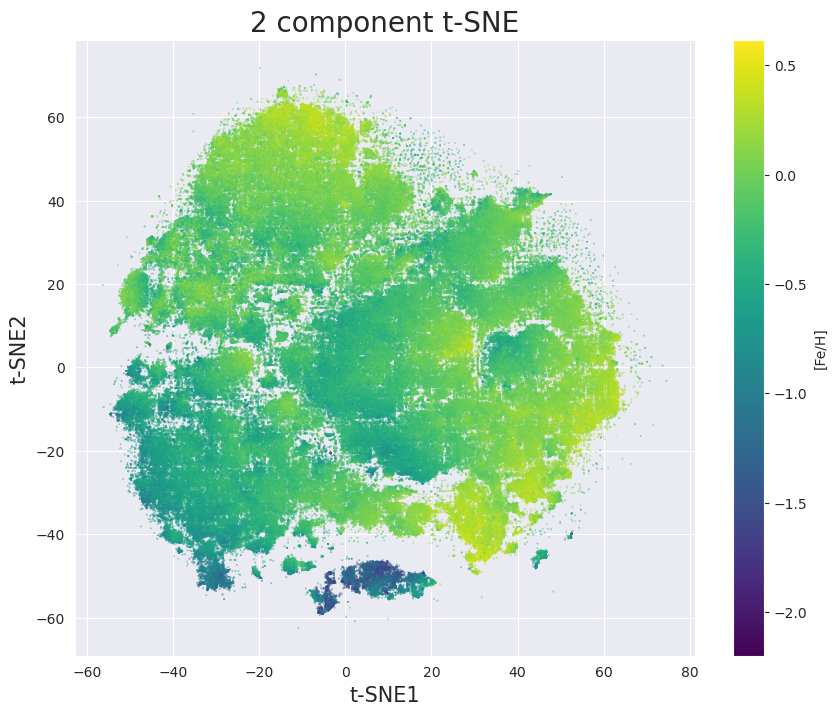

In [6]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(1,1,1)

# Create the scatter plot with color gradient from FE_H
sc = ax.scatter(data_tsne_pd[0], data_tsne_pd[1], s=0.05, c=data['FE_H'], cmap='viridis')
ax.set_xlabel('t-SNE1', fontsize=15)
ax.set_ylabel('t-SNE2', fontsize=15)
ax.set_title('2 component t-SNE', fontsize=20)

# Add a color bar with label
plt.colorbar(sc, label='[Fe/H]')
plt.show()

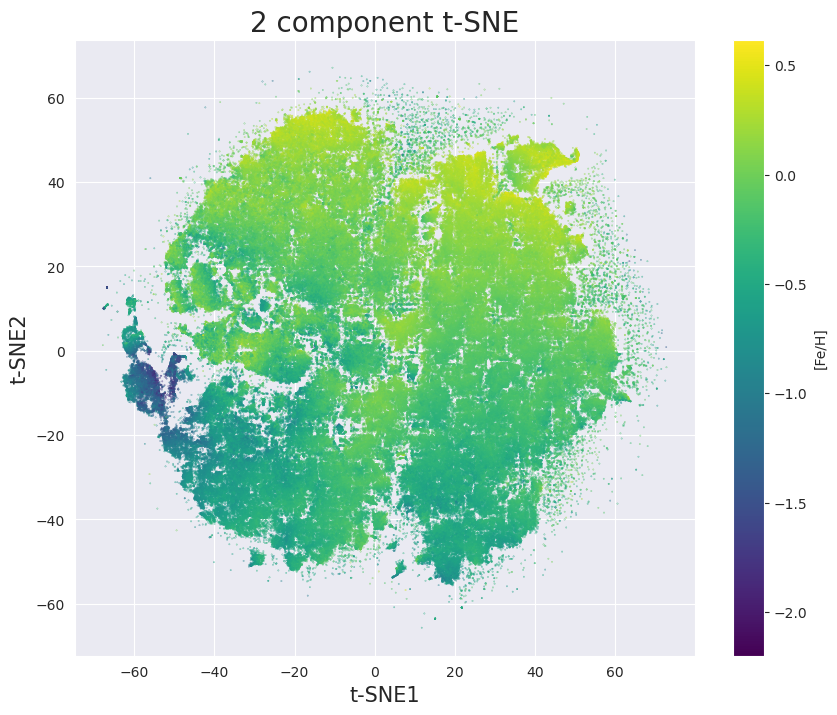

In [12]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(1,1,1)

# Create the scatter plot with color gradient from FE_H
sc = ax.scatter(data_tsne_pd[0], data_tsne_pd[1], s=0.05, c=data['FE_H'], cmap='viridis')
ax.set_xlabel('t-SNE1', fontsize=15)
ax.set_ylabel('t-SNE2', fontsize=15)
ax.set_title('2 component t-SNE', fontsize=20)

# Add a color bar with label
plt.colorbar(sc, label='[Fe/H]')
plt.show()

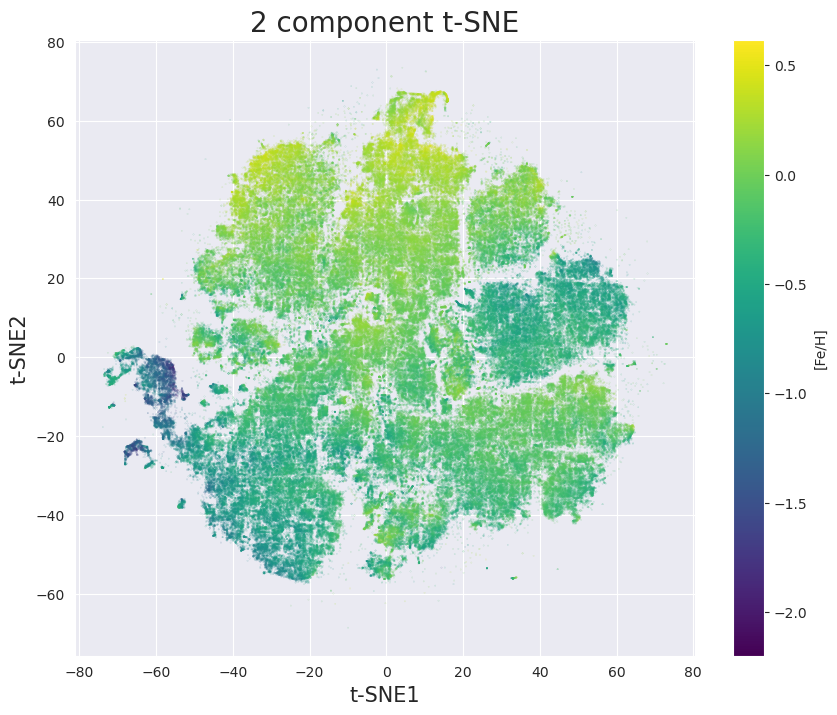

In [13]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(1,1,1)

# Create the scatter plot with color gradient from FE_H
sc = ax.scatter(data_tsne_pd[0], data_tsne_pd[1], s=0.005, c=data['FE_H'], cmap='viridis')
ax.set_xlabel('t-SNE1', fontsize=15)
ax.set_ylabel('t-SNE2', fontsize=15)
ax.set_title('2 component t-SNE', fontsize=20)

# Add a color bar with label
plt.colorbar(sc, label='[Fe/H]')
plt.show()